In [1]:
import math
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import OrderedDict
from tqdm import tqdm
import scipy
import pyDOE
from glob import glob

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.utils.prune as prune
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau

from net.models import NN

In [2]:
# 배치학습을 위한 데이터 로더 함수를 정의합니다.
def create_dataloader(x_data, y_data, batch_size, shuffle):
    dataset = TensorDataset(x_data, y_data)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
    return loader

In [3]:
def print_nonzeros(model):
    nonzero = total = 0
    for name, p in model.named_parameters():
        if 'mask' in name:
            continue
        tensor = p.data.cpu().numpy()
        nz_count = np.count_nonzero(tensor)
        total_params = np.prod(tensor.shape)
        nonzero += nz_count
        total += total_params
        print(f'{name:20} | nonzeros = {nz_count:7} / {total_params:7} ({100 * nz_count / total_params:6.2f}%) | total_pruned = {total_params - nz_count :7} | shape = {tensor.shape}')
    print(f'alive: {nonzero}, pruned : {total - nonzero}, total: {total}, Compression rate : {total/nonzero:10.2f}x  ({100 * (total-nonzero) / total:6.2f}% pruned)')

In [4]:
# CUDA 사용 가능한지 확인합니다.
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Device:', device)
print('Current cuda device:', torch.cuda.current_device())
print('Count of using GPUs:', torch.cuda.device_count())

Device: cuda
Current cuda device: 0
Count of using GPUs: 1


In [5]:
models = glob("./data/*_*.pt")
models

['./data/model_0.6461435586370163_0.7519880200471808_1.3459413475493847_.pt',
 './data/model_0.9926610113369381_1.0044676920990128_1.0638761184602317_.pt',
 './data/model_0.8056793994939285_1.667088624340879_0.6558453062090482_.pt',
 './data/model_1.0113005341300303_1.1042978763708164_0.9825942665038673_.pt',
 './data/model_1.3793156162463651_1.4235602716612665_0.5256465964473_.pt',
 './data/model_1.1550933504346717_1.3479038854802354_1.2269056767996454_.pt',
 './data/model_0.6964663563181073_0.8714126073073516_0.8858933764210435_.pt',
 './data/model_0.7807992483360096_1.2503325654877329_0.6434790402413546_.pt',
 './data/model_1.2516291665726755_0.6855972644708601_1.1553484825375557_.pt',
 './data/model_1.215064271879887_1.033489549337249_1.319033954472093_.pt',
 './data/model_0.882821876481688_0.6111822228604451_0.7286163354114135_.pt',
 './data/model_1.0600509553624107_1.80363778828612_0.8063141203855428_.pt',
 './data/model_0.7170707652711635_1.2481880765132585_1.5748870026040955_.p

In [6]:
# 하이퍼 파라미터
batch_size = 5000
shuffle = True # 데이터 셔플
epochs = 2000   # 훈련 epoch
alpha=0.5      # Total Loss = Data Loss + alpha * PDE Loss

# std threshold = 1

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.6461435586370163 	B: 0.7519880200471808 	C: 1.3459413475493847
Before pruning MSE Loss :  0.051921863
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (10

/tmp/ipykernel_3573/2647228203.py:21: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)


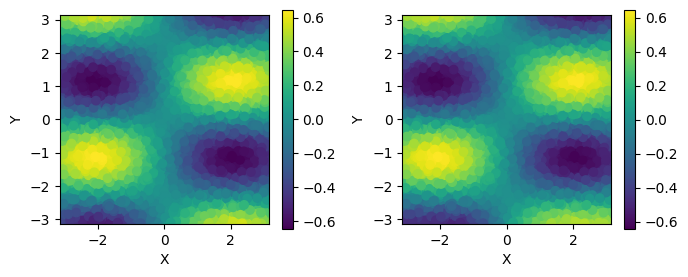

Pruning with threshold : 0.40351951122283936 for layer fc1
Pruning with threshold : 0.2450437992811203 for layer fc2
Pruning with threshold : 0.24181586503982544 for layer fc3
Pruning with threshold : 0.18899209797382355 for layer fc4
Pruning with threshold : 0.18513105809688568 for layer fc5
Pruning with threshold : 0.181453675031662 for layer fc6
Pruning with threshold : 0.15136581659317017 for layer fc7
Pruning with threshold : 0.11749399453401566 for layer fc8
after pruning MSE Loss :  0.2615441
fc1.weight           | nonzeros =      15 /      40 ( 37.50%) | total_pruned =      25 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     123 /     400 ( 30.75%) | total_pruned =     277 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     117 /     400 ( 29.25%) | total_pruned =

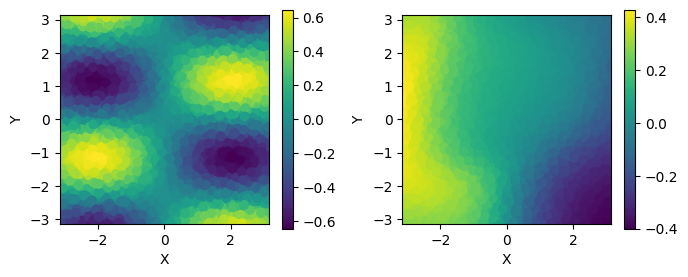

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.9926610113369381 	B: 1.0044676920990128 	C: 1.0638761184602317
Before pruning MSE Loss :  0.04581528
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

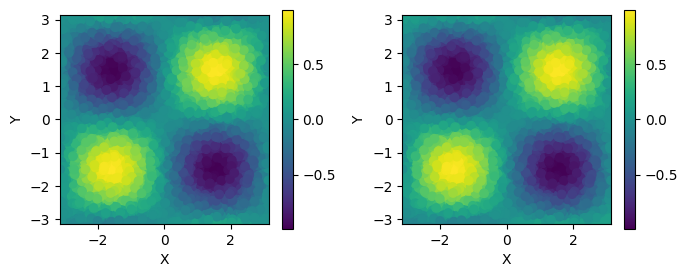

Pruning with threshold : 0.43911033868789673 for layer fc1
Pruning with threshold : 0.2513428330421448 for layer fc2
Pruning with threshold : 0.25966933369636536 for layer fc3
Pruning with threshold : 0.21819469332695007 for layer fc4
Pruning with threshold : 0.2161198854446411 for layer fc5
Pruning with threshold : 0.1860460788011551 for layer fc6
Pruning with threshold : 0.17656542360782623 for layer fc7
Pruning with threshold : 0.16613619029521942 for layer fc8
after pruning MSE Loss :  0.38788936
fc1.weight           | nonzeros =      19 /      40 ( 47.50%) | total_pruned =      21 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     134 /     400 ( 33.50%) | total_pruned =     266 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     134 /     400 ( 33.50%) | total_pruned 

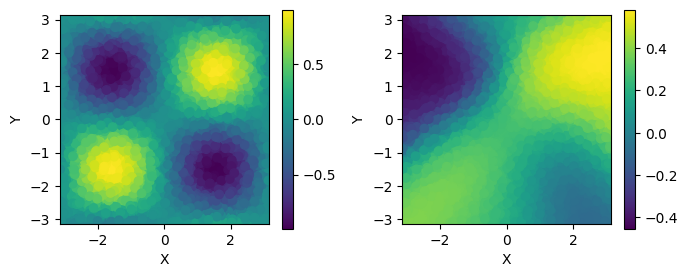

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.8056793994939285 	B: 1.667088624340879 	C: 0.6558453062090482
Before pruning MSE Loss :  0.065595016
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

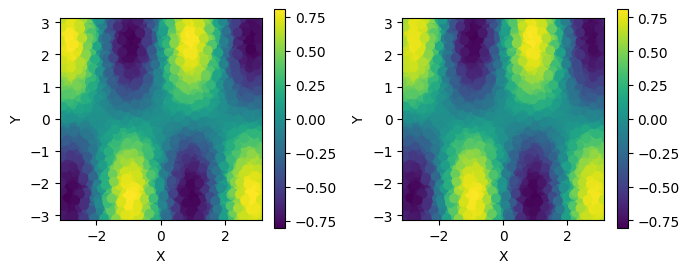

Pruning with threshold : 0.48560991883277893 for layer fc1
Pruning with threshold : 0.2540363371372223 for layer fc2
Pruning with threshold : 0.23737823963165283 for layer fc3
Pruning with threshold : 0.2133771926164627 for layer fc4
Pruning with threshold : 0.20348122715950012 for layer fc5
Pruning with threshold : 0.18579167127609253 for layer fc6
Pruning with threshold : 0.17998316884040833 for layer fc7
Pruning with threshold : 0.15482838451862335 for layer fc8
after pruning MSE Loss :  0.38848048
fc1.weight           | nonzeros =      14 /      40 ( 35.00%) | total_pruned =      26 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     123 /     400 ( 30.75%) | total_pruned =     277 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     113 /     400 ( 28.25%) | total_pruned

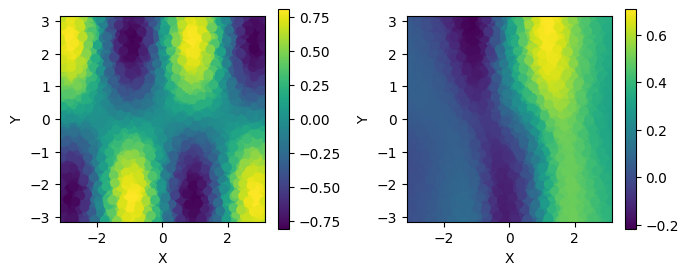

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.0113005341300303 	B: 1.1042978763708164 	C: 0.9825942665038673
Before pruning MSE Loss :  0.051190443
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (10

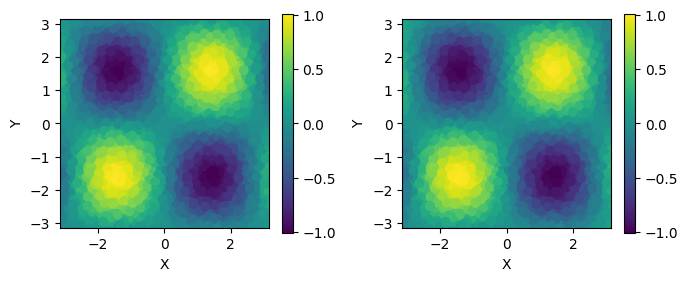

Pruning with threshold : 0.44377994537353516 for layer fc1
Pruning with threshold : 0.24456021189689636 for layer fc2
Pruning with threshold : 0.25300613045692444 for layer fc3
Pruning with threshold : 0.21640223264694214 for layer fc4
Pruning with threshold : 0.20831672847270966 for layer fc5
Pruning with threshold : 0.18473991751670837 for layer fc6
Pruning with threshold : 0.16952751576900482 for layer fc7
Pruning with threshold : 0.15540330111980438 for layer fc8
after pruning MSE Loss :  0.3942732
fc1.weight           | nonzeros =      18 /      40 ( 45.00%) | total_pruned =      22 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     140 /     400 ( 35.00%) | total_pruned =     260 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     121 /     400 ( 30.25%) | total_prune

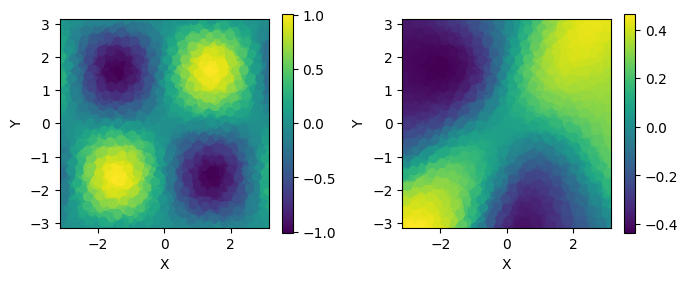

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.3793156162463651 	B: 1.4235602716612665 	C: 0.5256465964473
Before pruning MSE Loss :  0.07946929
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00

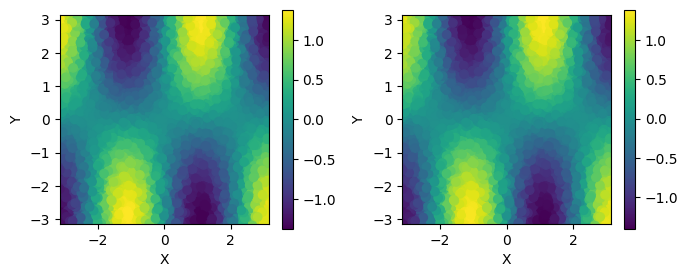

Pruning with threshold : 0.4055655598640442 for layer fc1
Pruning with threshold : 0.2545771300792694 for layer fc2
Pruning with threshold : 0.24529269337654114 for layer fc3
Pruning with threshold : 0.21570611000061035 for layer fc4
Pruning with threshold : 0.20323215425014496 for layer fc5
Pruning with threshold : 0.18543808162212372 for layer fc6
Pruning with threshold : 0.16682623326778412 for layer fc7
Pruning with threshold : 0.18252678215503693 for layer fc8
after pruning MSE Loss :  0.5608494
fc1.weight           | nonzeros =      16 /      40 ( 40.00%) | total_pruned =      24 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     121 /     400 ( 30.25%) | total_pruned =     279 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     122 /     400 ( 30.50%) | total_pruned 

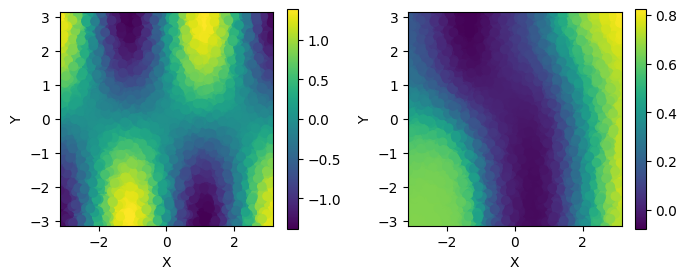

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.1550933504346717 	B: 1.3479038854802354 	C: 1.2269056767996454
Before pruning MSE Loss :  0.09262624
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

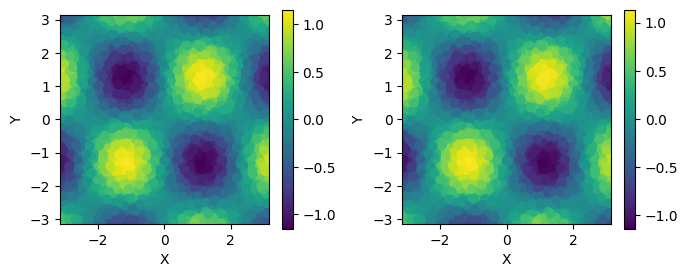

Pruning with threshold : 0.4246470630168915 for layer fc1
Pruning with threshold : 0.247306689620018 for layer fc2
Pruning with threshold : 0.2557885944843292 for layer fc3
Pruning with threshold : 0.22178752720355988 for layer fc4
Pruning with threshold : 0.18256627023220062 for layer fc5
Pruning with threshold : 0.1907804161310196 for layer fc6
Pruning with threshold : 0.17381851375102997 for layer fc7
Pruning with threshold : 0.16207751631736755 for layer fc8
after pruning MSE Loss :  0.5930577
fc1.weight           | nonzeros =      17 /      40 ( 42.50%) | total_pruned =      23 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     133 /     400 ( 33.25%) | total_pruned =     267 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     125 /     400 ( 31.25%) | total_pruned =  

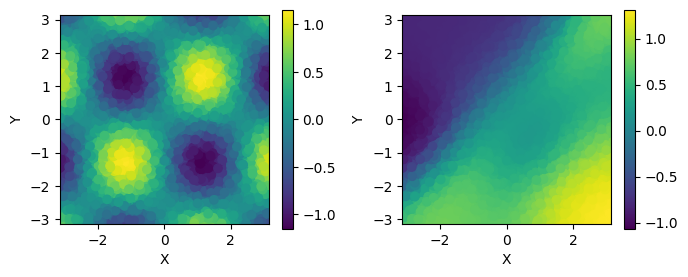

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.6964663563181073 	B: 0.8714126073073516 	C: 0.8858933764210435
Before pruning MSE Loss :  0.029162524
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (10

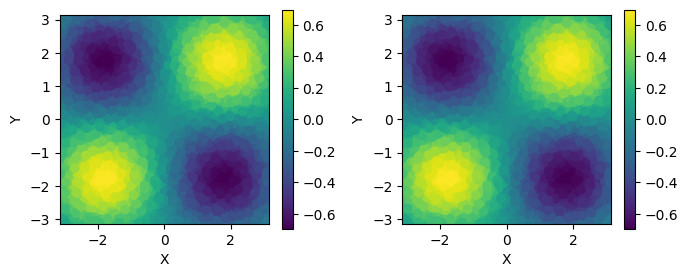

Pruning with threshold : 0.41628772020339966 for layer fc1
Pruning with threshold : 0.22372469305992126 for layer fc2
Pruning with threshold : 0.2065972536802292 for layer fc3
Pruning with threshold : 0.20684435963630676 for layer fc4
Pruning with threshold : 0.19445893168449402 for layer fc5
Pruning with threshold : 0.17782221734523773 for layer fc6
Pruning with threshold : 0.1567729115486145 for layer fc7
Pruning with threshold : 0.11879471689462662 for layer fc8
after pruning MSE Loss :  0.3097853
fc1.weight           | nonzeros =      18 /      40 ( 45.00%) | total_pruned =      22 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     131 /     400 ( 32.75%) | total_pruned =     269 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     119 /     400 ( 29.75%) | total_pruned 

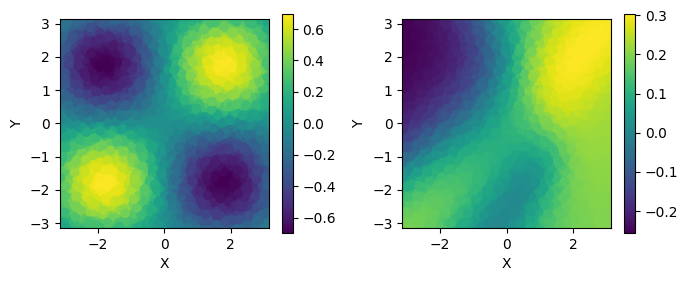

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.7807992483360096 	B: 1.2503325654877329 	C: 0.6434790402413546
Before pruning MSE Loss :  0.030495431
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (10

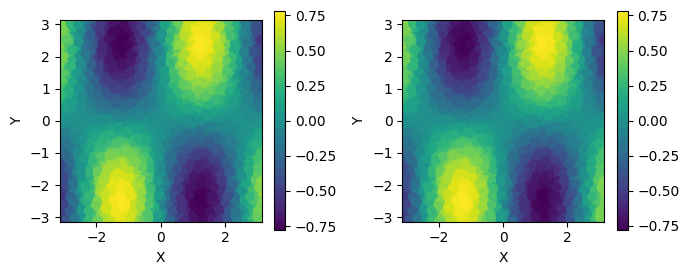

Pruning with threshold : 0.4200270473957062 for layer fc1
Pruning with threshold : 0.24259884655475616 for layer fc2
Pruning with threshold : 0.23494073748588562 for layer fc3
Pruning with threshold : 0.20077919960021973 for layer fc4
Pruning with threshold : 0.19853150844573975 for layer fc5
Pruning with threshold : 0.1737697720527649 for layer fc6
Pruning with threshold : 0.15496256947517395 for layer fc7
Pruning with threshold : 0.11312083154916763 for layer fc8
after pruning MSE Loss :  0.34818715
fc1.weight           | nonzeros =      15 /      40 ( 37.50%) | total_pruned =      25 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     130 /     400 ( 32.50%) | total_pruned =     270 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     116 /     400 ( 29.00%) | total_pruned

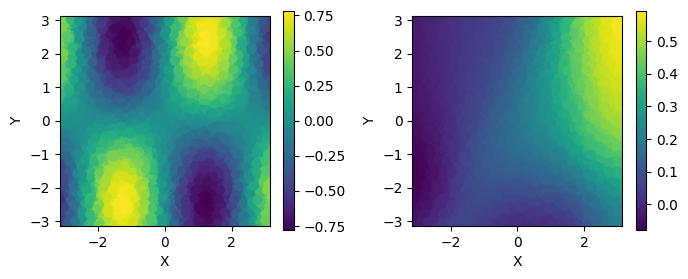

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.2516291665726755 	B: 0.6855972644708601 	C: 1.1553484825375557
Before pruning MSE Loss :  0.05462811
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

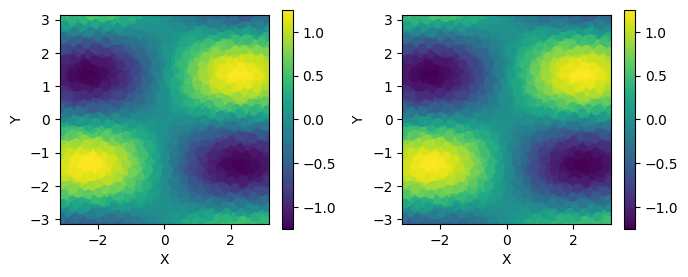

Pruning with threshold : 0.41951784491539 for layer fc1
Pruning with threshold : 0.20515988767147064 for layer fc2
Pruning with threshold : 0.20261390507221222 for layer fc3
Pruning with threshold : 0.18253615498542786 for layer fc4
Pruning with threshold : 0.18792065978050232 for layer fc5
Pruning with threshold : 0.17378605902194977 for layer fc6
Pruning with threshold : 0.1721537709236145 for layer fc7
Pruning with threshold : 0.19007238745689392 for layer fc8
after pruning MSE Loss :  0.53110576
fc1.weight           | nonzeros =      15 /      40 ( 37.50%) | total_pruned =      25 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     130 /     400 ( 32.50%) | total_pruned =     270 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     116 /     400 ( 29.00%) | total_pruned =

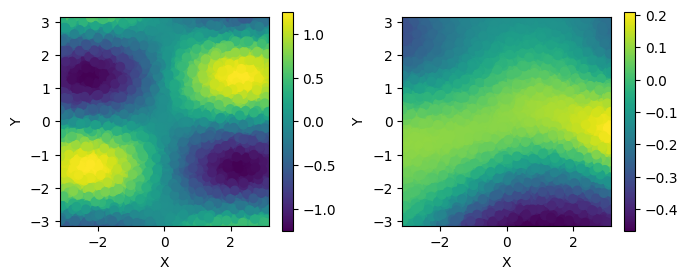

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.215064271879887 	B: 1.033489549337249 	C: 1.319033954472093
Before pruning MSE Loss :  0.07172293
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00

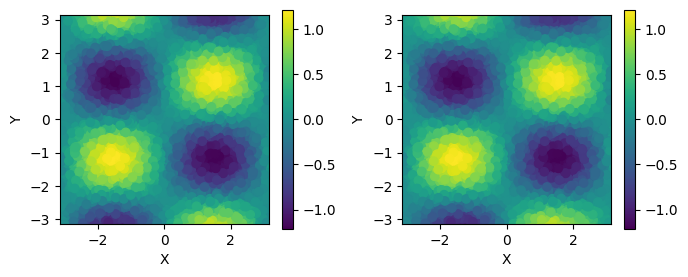

Pruning with threshold : 0.44087839126586914 for layer fc1
Pruning with threshold : 0.24296192824840546 for layer fc2
Pruning with threshold : 0.259136825799942 for layer fc3
Pruning with threshold : 0.21250948309898376 for layer fc4
Pruning with threshold : 0.23805397748947144 for layer fc5
Pruning with threshold : 0.21210415661334991 for layer fc6
Pruning with threshold : 0.18807584047317505 for layer fc7
Pruning with threshold : 0.1996881663799286 for layer fc8
after pruning MSE Loss :  0.45056427
fc1.weight           | nonzeros =      17 /      40 ( 42.50%) | total_pruned =      23 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     125 /     400 ( 31.25%) | total_pruned =     275 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     109 /     400 ( 27.25%) | total_pruned 

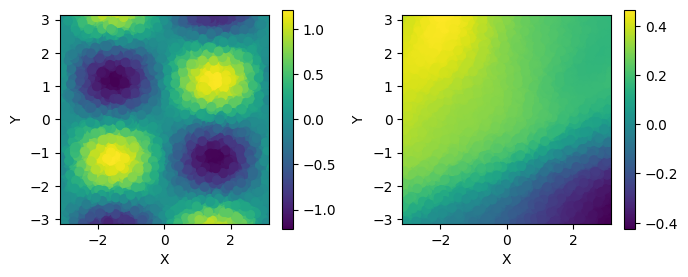

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.882821876481688 	B: 0.6111822228604451 	C: 0.7286163354114135
Before pruning MSE Loss :  0.10829572
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.

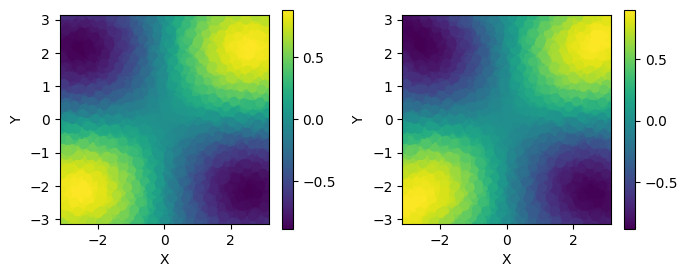

Pruning with threshold : 0.39909130334854126 for layer fc1
Pruning with threshold : 0.18871869146823883 for layer fc2
Pruning with threshold : 0.18900007009506226 for layer fc3
Pruning with threshold : 0.17222672700881958 for layer fc4
Pruning with threshold : 0.1607118397951126 for layer fc5
Pruning with threshold : 0.15411004424095154 for layer fc6
Pruning with threshold : 0.15068715810775757 for layer fc7
Pruning with threshold : 0.1392410844564438 for layer fc8
after pruning MSE Loss :  0.42261115
fc1.weight           | nonzeros =      23 /      40 ( 57.50%) | total_pruned =      17 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     125 /     400 ( 31.25%) | total_pruned =     275 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     110 /     400 ( 27.50%) | total_pruned

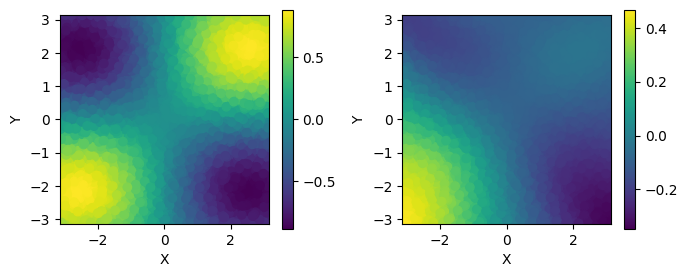

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.0600509553624107 	B: 1.80363778828612 	C: 0.8063141203855428
Before pruning MSE Loss :  0.08634806
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.0

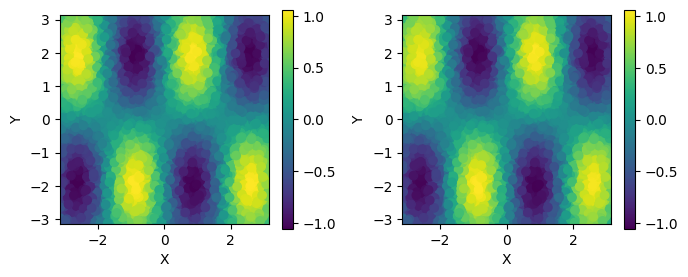

Pruning with threshold : 0.4603630006313324 for layer fc1
Pruning with threshold : 0.2315647155046463 for layer fc2
Pruning with threshold : 0.24424579739570618 for layer fc3
Pruning with threshold : 0.22139903903007507 for layer fc4
Pruning with threshold : 0.21525147557258606 for layer fc5
Pruning with threshold : 0.19394181668758392 for layer fc6
Pruning with threshold : 0.18174700438976288 for layer fc7
Pruning with threshold : 0.17655791342258453 for layer fc8
after pruning MSE Loss :  0.5029323
fc1.weight           | nonzeros =      13 /      40 ( 32.50%) | total_pruned =      27 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     135 /     400 ( 33.75%) | total_pruned =     265 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     103 /     400 ( 25.75%) | total_pruned 

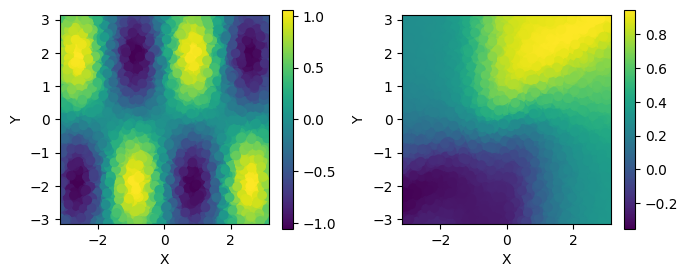

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 0.7170707652711635 	B: 1.2481880765132585 	C: 1.5748870026040955
Before pruning MSE Loss :  0.1534799
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.

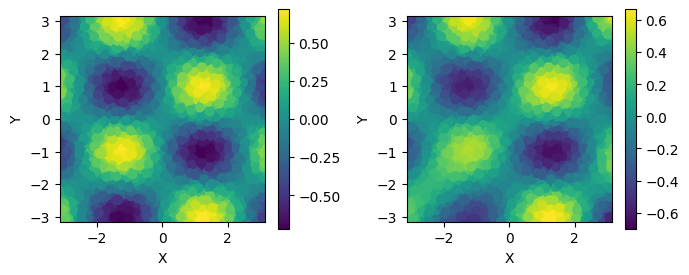

Pruning with threshold : 0.44821321964263916 for layer fc1
Pruning with threshold : 0.2327505201101303 for layer fc2
Pruning with threshold : 0.22096216678619385 for layer fc3
Pruning with threshold : 0.1848585605621338 for layer fc4
Pruning with threshold : 0.17468750476837158 for layer fc5
Pruning with threshold : 0.17682687938213348 for layer fc6
Pruning with threshold : 0.16734983026981354 for layer fc7
Pruning with threshold : 0.13198219239711761 for layer fc8
after pruning MSE Loss :  0.30850795
fc1.weight           | nonzeros =      17 /      40 ( 42.50%) | total_pruned =      23 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     127 /     400 ( 31.75%) | total_pruned =     273 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     118 /     400 ( 29.50%) | total_pruned

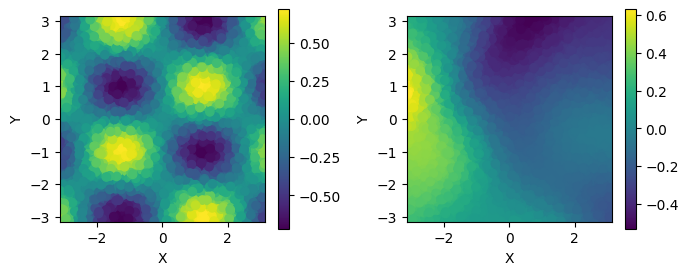

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.3027367182262846 	B: 0.5521091050706922 	C: 1.4942715403090903
Before pruning MSE Loss :  0.06235797
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

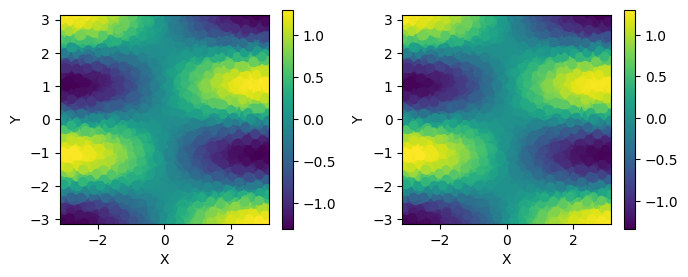

Pruning with threshold : 0.4039284586906433 for layer fc1
Pruning with threshold : 0.2247104048728943 for layer fc2
Pruning with threshold : 0.27413371205329895 for layer fc3
Pruning with threshold : 0.20327283442020416 for layer fc4
Pruning with threshold : 0.2288450002670288 for layer fc5
Pruning with threshold : 0.20637044310569763 for layer fc6
Pruning with threshold : 0.17409954965114594 for layer fc7
Pruning with threshold : 0.2137158066034317 for layer fc8
after pruning MSE Loss :  0.57953274
fc1.weight           | nonzeros =      15 /      40 ( 37.50%) | total_pruned =      25 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     129 /     400 ( 32.25%) | total_pruned =     271 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     101 /     400 ( 25.25%) | total_pruned =

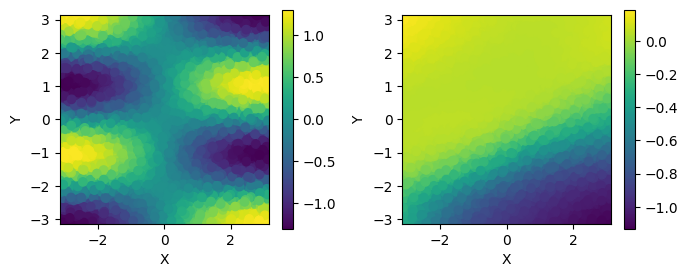

---------------------------------------------------------------------------------------------------------
---------------------------------------------------------------------------------------------------------
A: 1.4414725726351811 	B: 0.9122516777264776 	C: 1.405664910808274
Before pruning MSE Loss :  0.094763115
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100

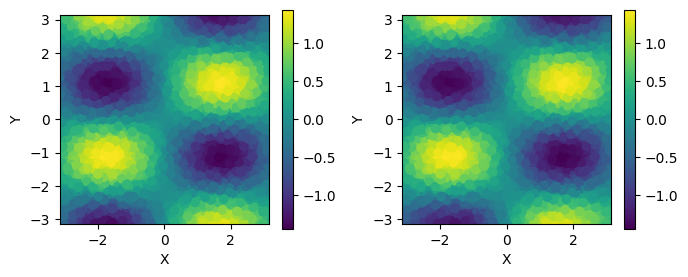

Pruning with threshold : 0.4200974702835083 for layer fc1
Pruning with threshold : 0.24240626394748688 for layer fc2
Pruning with threshold : 0.2625545561313629 for layer fc3
Pruning with threshold : 0.21388021111488342 for layer fc4
Pruning with threshold : 0.21985317766666412 for layer fc5
Pruning with threshold : 0.20832037925720215 for layer fc6
Pruning with threshold : 0.18698981404304504 for layer fc7
Pruning with threshold : 0.18650507926940918 for layer fc8
after pruning MSE Loss :  0.58849275
fc1.weight           | nonzeros =      14 /      40 ( 35.00%) | total_pruned =      26 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     130 /     400 ( 32.50%) | total_pruned =     270 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     125 /     400 ( 31.25%) | total_pruned

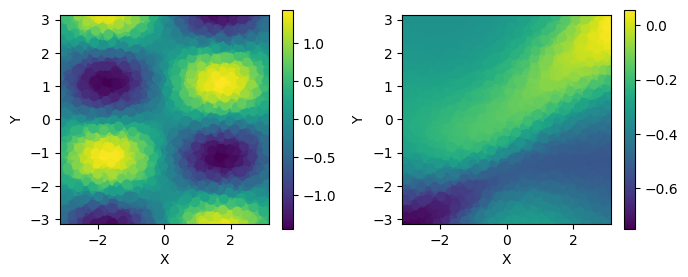

In [8]:
before_1 = []
after_1 = []

for model in models:
    print("---------------------------------------------------------------------------------------------------------")
    print("---------------------------------------------------------------------------------------------------------")
    ABC = model.split("_")[1:4]
    A = torch.tensor(float(ABC[0]), dtype=torch.float)
    B = torch.tensor(float(ABC[1]), dtype=torch.float)
    C = torch.tensor(float(ABC[2]), dtype=torch.float)
    print("A:",ABC[0],"\tB:",ABC[1],"\tC:",ABC[2])
    task = f"./data/train_{ABC[0]}_{ABC[1]}_{ABC[2]}_.npy"
    # 데이터를 준비합니다.
    with open(task, 'rb') as f:
        data = np.load(f,allow_pickle=True)
    x = data.T[0]
    y = data.T[1]
    f_true = A*np.sin(B*x) * np.sin(C*y)
    X = np.stack([x.ravel(), y.ravel()], axis=-1)
    X = torch.tensor(X, dtype=torch.float).to(device)
    f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)

    A = A.to(device)
    B = B.to(device)
    C = C.to(device)
    # 데이터 로더를 생성합니다.
    loader = create_dataloader(X, f_true, batch_size, shuffle)


    net = NN(mask=True)
    net.load_state_dict(torch.load(f"./data/model_{ABC[0]}_{ABC[1]}_{ABC[2]}_.pt"))
    net = net.to(device)

    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## before pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    before_1.append(loss)
    print("Before pruning MSE Loss : ", loss)
    print_nonzeros(net)
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()
    
    
    ################################## pruning start #####################################
    net.prune_by_std(1)
    
    ################################## pruning end #####################################
    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## after pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    after_1.append(loss)
    print("after pruning MSE Loss : ", loss)
    print_nonzeros(net)
    
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()

# std threshold = 0.5

A: 0.6461435586370163 	B: 0.7519880200471808 	C: 1.3459413475493847
Before pruning MSE Loss :  0.051921863
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

/tmp/ipykernel_3573/1339504061.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)


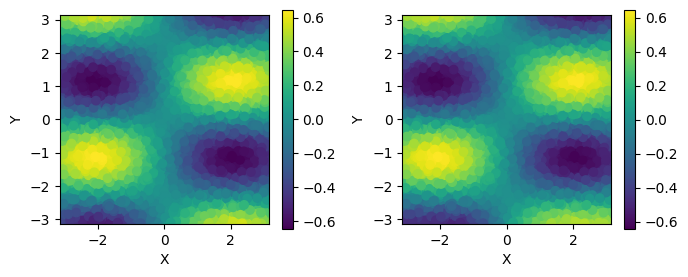

Pruning with threshold : 0.20175975561141968 for layer fc1
Pruning with threshold : 0.12252189964056015 for layer fc2
Pruning with threshold : 0.12090793251991272 for layer fc3
Pruning with threshold : 0.09449604898691177 for layer fc4
Pruning with threshold : 0.09256552904844284 for layer fc5
Pruning with threshold : 0.090726837515831 for layer fc6
Pruning with threshold : 0.07568290829658508 for layer fc7
Pruning with threshold : 0.05874699726700783 for layer fc8
after pruning MSE Loss :  0.20918916
fc1.weight           | nonzeros =      28 /      40 ( 70.00%) | total_pruned =      12 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     259 /     400 ( 64.75%) | total_pruned =     141 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     242 /     400 ( 60.50%) | total_pruned

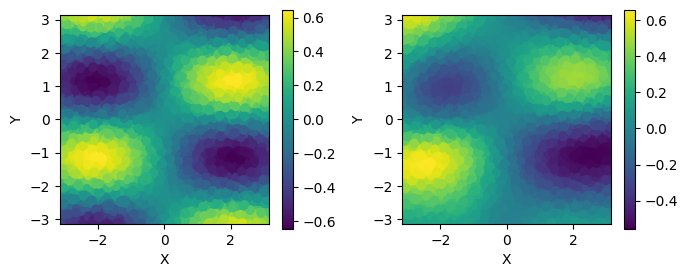

A: 0.9926610113369381 	B: 1.0044676920990128 	C: 1.0638761184602317
Before pruning MSE Loss :  0.04581528
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

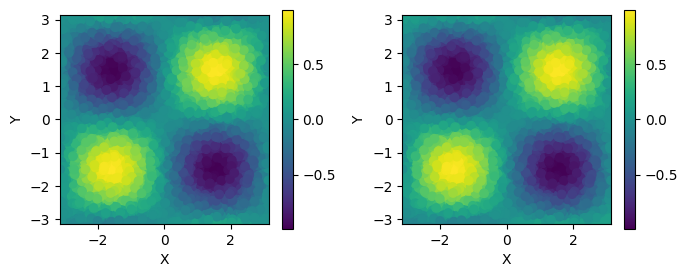

Pruning with threshold : 0.21955516934394836 for layer fc1
Pruning with threshold : 0.1256714165210724 for layer fc2
Pruning with threshold : 0.12983466684818268 for layer fc3
Pruning with threshold : 0.10909734666347504 for layer fc4
Pruning with threshold : 0.10805994272232056 for layer fc5
Pruning with threshold : 0.09302303940057755 for layer fc6
Pruning with threshold : 0.08828271180391312 for layer fc7
Pruning with threshold : 0.08306809514760971 for layer fc8
after pruning MSE Loss :  0.47875068
fc1.weight           | nonzeros =      29 /      40 ( 72.50%) | total_pruned =      11 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     264 /     400 ( 66.00%) | total_pruned =     136 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     243 /     400 ( 60.75%) | total_prune

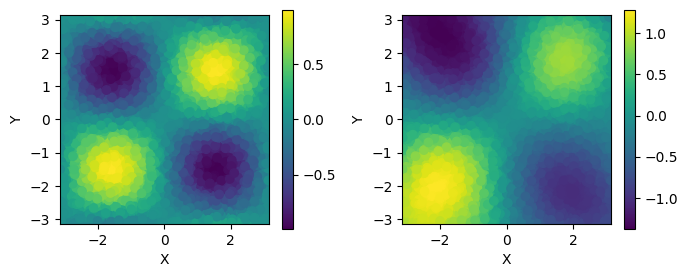

A: 0.8056793994939285 	B: 1.667088624340879 	C: 0.6558453062090482
Before pruning MSE Loss :  0.065595016
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

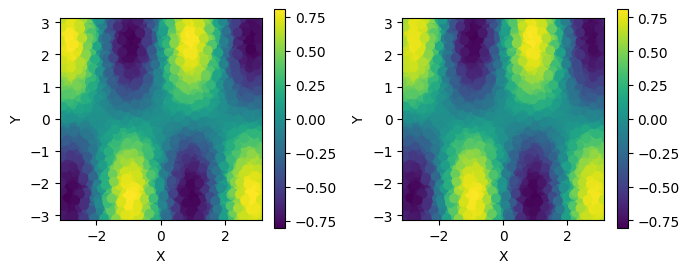

Pruning with threshold : 0.24280495941638947 for layer fc1
Pruning with threshold : 0.12701816856861115 for layer fc2
Pruning with threshold : 0.11868911981582642 for layer fc3
Pruning with threshold : 0.10668859630823135 for layer fc4
Pruning with threshold : 0.10174061357975006 for layer fc5
Pruning with threshold : 0.09289583563804626 for layer fc6
Pruning with threshold : 0.08999158442020416 for layer fc7
Pruning with threshold : 0.07741419225931168 for layer fc8
after pruning MSE Loss :  0.54708093
fc1.weight           | nonzeros =      26 /      40 ( 65.00%) | total_pruned =      14 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     257 /     400 ( 64.25%) | total_pruned =     143 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     237 /     400 ( 59.25%) | total_prun

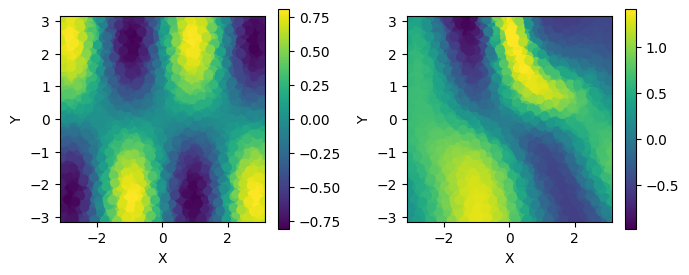

A: 1.0113005341300303 	B: 1.1042978763708164 	C: 0.9825942665038673
Before pruning MSE Loss :  0.051190443
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

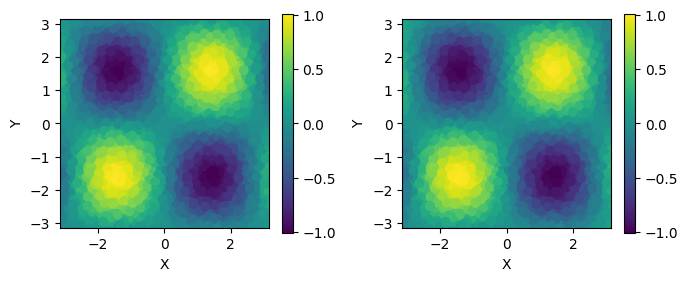

Pruning with threshold : 0.22188997268676758 for layer fc1
Pruning with threshold : 0.12228010594844818 for layer fc2
Pruning with threshold : 0.12650306522846222 for layer fc3
Pruning with threshold : 0.10820111632347107 for layer fc4
Pruning with threshold : 0.10415836423635483 for layer fc5
Pruning with threshold : 0.09236995875835419 for layer fc6
Pruning with threshold : 0.08476375788450241 for layer fc7
Pruning with threshold : 0.07770165055990219 for layer fc8
after pruning MSE Loss :  0.3475487
fc1.weight           | nonzeros =      30 /      40 ( 75.00%) | total_pruned =      10 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     259 /     400 ( 64.75%) | total_pruned =     141 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     221 /     400 ( 55.25%) | total_prune

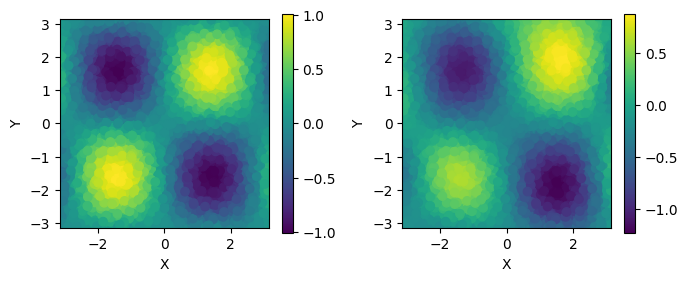

A: 1.3793156162463651 	B: 1.4235602716612665 	C: 0.5256465964473
Before pruning MSE Loss :  0.07946929
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%) 

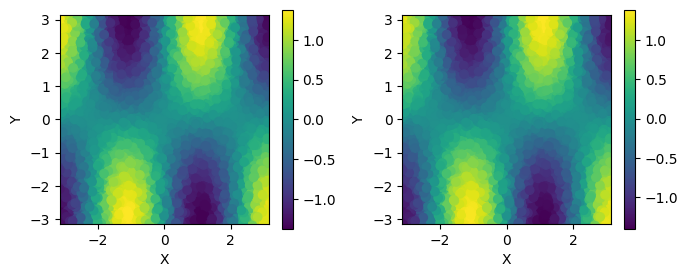

Pruning with threshold : 0.2027827799320221 for layer fc1
Pruning with threshold : 0.1272885650396347 for layer fc2
Pruning with threshold : 0.12264634668827057 for layer fc3
Pruning with threshold : 0.10785305500030518 for layer fc4
Pruning with threshold : 0.10161607712507248 for layer fc5
Pruning with threshold : 0.09271904081106186 for layer fc6
Pruning with threshold : 0.08341311663389206 for layer fc7
Pruning with threshold : 0.09126339107751846 for layer fc8
after pruning MSE Loss :  0.7113944
fc1.weight           | nonzeros =      26 /      40 ( 65.00%) | total_pruned =      14 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     249 /     400 ( 62.25%) | total_pruned =     151 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     260 /     400 ( 65.00%) | total_pruned 

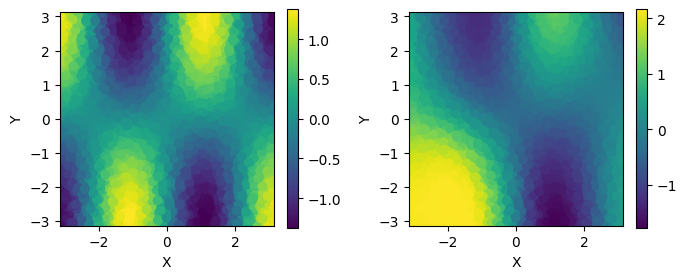

A: 1.1550933504346717 	B: 1.3479038854802354 	C: 1.2269056767996454
Before pruning MSE Loss :  0.09262624
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

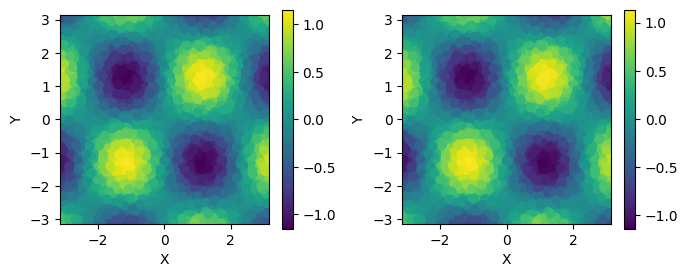

Pruning with threshold : 0.21232353150844574 for layer fc1
Pruning with threshold : 0.123653344810009 for layer fc2
Pruning with threshold : 0.1278942972421646 for layer fc3
Pruning with threshold : 0.11089376360177994 for layer fc4
Pruning with threshold : 0.09128313511610031 for layer fc5
Pruning with threshold : 0.0953902080655098 for layer fc6
Pruning with threshold : 0.08690925687551498 for layer fc7
Pruning with threshold : 0.08103875815868378 for layer fc8
after pruning MSE Loss :  0.98658943
fc1.weight           | nonzeros =      27 /      40 ( 67.50%) | total_pruned =      13 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     266 /     400 ( 66.50%) | total_pruned =     134 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     243 /     400 ( 60.75%) | total_pruned =

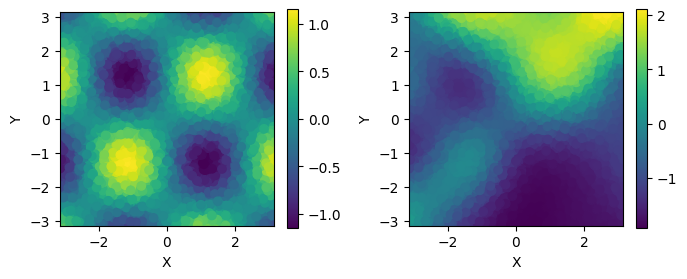

A: 0.6964663563181073 	B: 0.8714126073073516 	C: 0.8858933764210435
Before pruning MSE Loss :  0.029162524
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

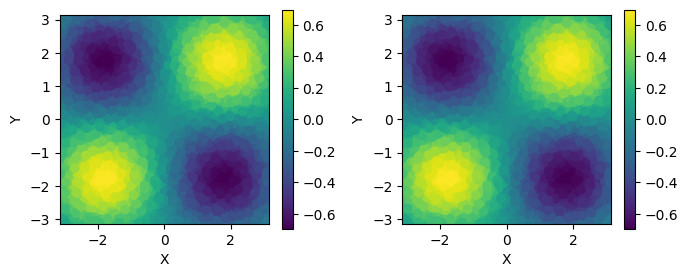

Pruning with threshold : 0.20814386010169983 for layer fc1
Pruning with threshold : 0.11186234652996063 for layer fc2
Pruning with threshold : 0.1032986268401146 for layer fc3
Pruning with threshold : 0.10342217981815338 for layer fc4
Pruning with threshold : 0.09722946584224701 for layer fc5
Pruning with threshold : 0.08891110867261887 for layer fc6
Pruning with threshold : 0.07838645577430725 for layer fc7
Pruning with threshold : 0.05939735844731331 for layer fc8
after pruning MSE Loss :  0.3062069
fc1.weight           | nonzeros =      28 /      40 ( 70.00%) | total_pruned =      12 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     265 /     400 ( 66.25%) | total_pruned =     135 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     239 /     400 ( 59.75%) | total_pruned

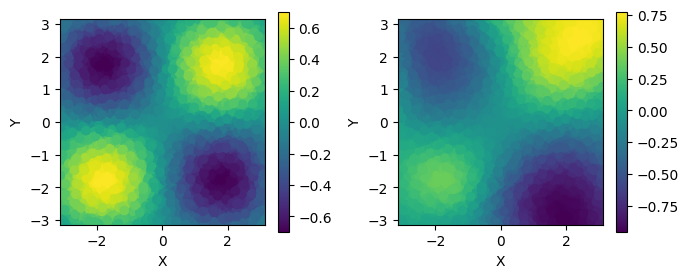

A: 0.7807992483360096 	B: 1.2503325654877329 	C: 0.6434790402413546
Before pruning MSE Loss :  0.030495431
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

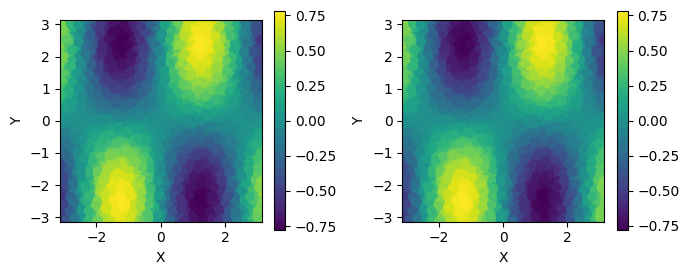

Pruning with threshold : 0.2100135236978531 for layer fc1
Pruning with threshold : 0.12129942327737808 for layer fc2
Pruning with threshold : 0.11747036874294281 for layer fc3
Pruning with threshold : 0.10038959980010986 for layer fc4
Pruning with threshold : 0.09926575422286987 for layer fc5
Pruning with threshold : 0.08688488602638245 for layer fc6
Pruning with threshold : 0.07748128473758698 for layer fc7
Pruning with threshold : 0.056560415774583817 for layer fc8
after pruning MSE Loss :  0.43582404
fc1.weight           | nonzeros =      26 /      40 ( 65.00%) | total_pruned =      14 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     252 /     400 ( 63.00%) | total_pruned =     148 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     237 /     400 ( 59.25%) | total_prun

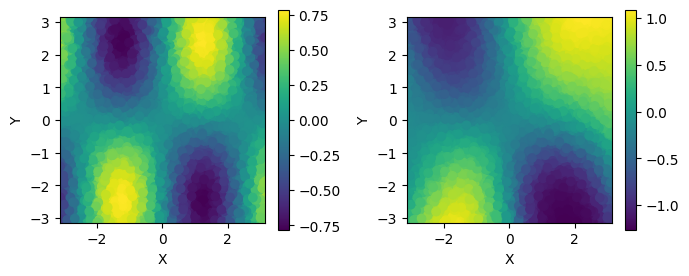

A: 1.2516291665726755 	B: 0.6855972644708601 	C: 1.1553484825375557
Before pruning MSE Loss :  0.05462811
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

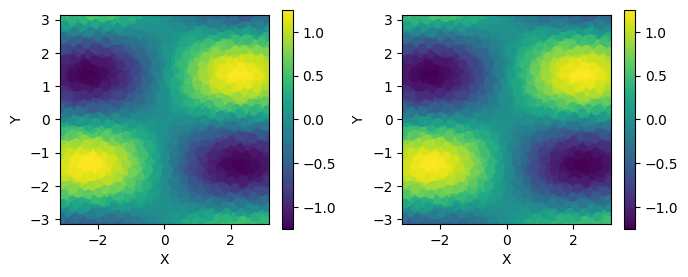

Pruning with threshold : 0.209758922457695 for layer fc1
Pruning with threshold : 0.10257994383573532 for layer fc2
Pruning with threshold : 0.10130695253610611 for layer fc3
Pruning with threshold : 0.09126807749271393 for layer fc4
Pruning with threshold : 0.09396032989025116 for layer fc5
Pruning with threshold : 0.08689302951097488 for layer fc6
Pruning with threshold : 0.08607688546180725 for layer fc7
Pruning with threshold : 0.09503619372844696 for layer fc8
after pruning MSE Loss :  0.5794286
fc1.weight           | nonzeros =      28 /      40 ( 70.00%) | total_pruned =      12 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     245 /     400 ( 61.25%) | total_pruned =     155 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     242 /     400 ( 60.50%) | total_pruned 

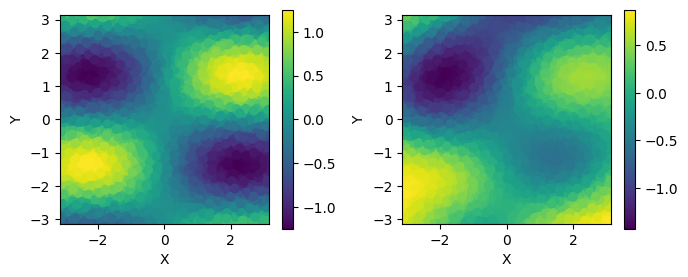

A: 1.215064271879887 	B: 1.033489549337249 	C: 1.319033954472093
Before pruning MSE Loss :  0.07172293
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%) 

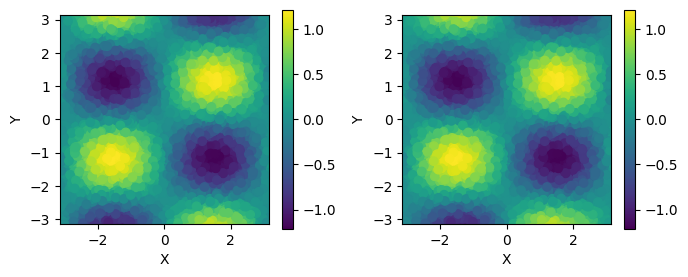

Pruning with threshold : 0.22043919563293457 for layer fc1
Pruning with threshold : 0.12148096412420273 for layer fc2
Pruning with threshold : 0.129568412899971 for layer fc3
Pruning with threshold : 0.10625474154949188 for layer fc4
Pruning with threshold : 0.11902698874473572 for layer fc5
Pruning with threshold : 0.10605207830667496 for layer fc6
Pruning with threshold : 0.09403792023658752 for layer fc7
Pruning with threshold : 0.0998440831899643 for layer fc8
after pruning MSE Loss :  0.4586268
fc1.weight           | nonzeros =      29 /      40 ( 72.50%) | total_pruned =      11 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     251 /     400 ( 62.75%) | total_pruned =     149 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     250 /     400 ( 62.50%) | total_pruned =

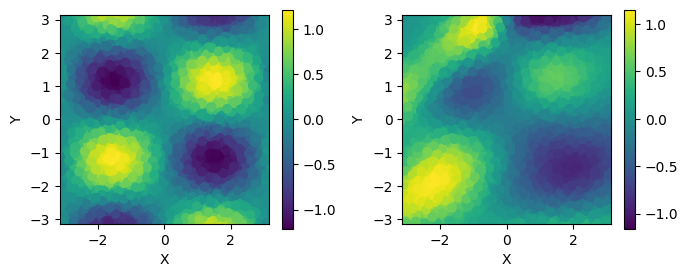

A: 0.882821876481688 	B: 0.6111822228604451 	C: 0.7286163354114135
Before pruning MSE Loss :  0.10829572
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%

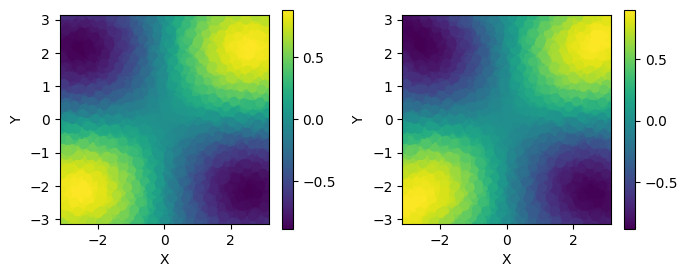

Pruning with threshold : 0.19954565167427063 for layer fc1
Pruning with threshold : 0.09435934573411942 for layer fc2
Pruning with threshold : 0.09450003504753113 for layer fc3
Pruning with threshold : 0.08611336350440979 for layer fc4
Pruning with threshold : 0.0803559198975563 for layer fc5
Pruning with threshold : 0.07705502212047577 for layer fc6
Pruning with threshold : 0.07534357905387878 for layer fc7
Pruning with threshold : 0.0696205422282219 for layer fc8
after pruning MSE Loss :  0.33735123
fc1.weight           | nonzeros =      31 /      40 ( 77.50%) | total_pruned =       9 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     249 /     400 ( 62.25%) | total_pruned =     151 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     240 /     400 ( 60.00%) | total_pruned

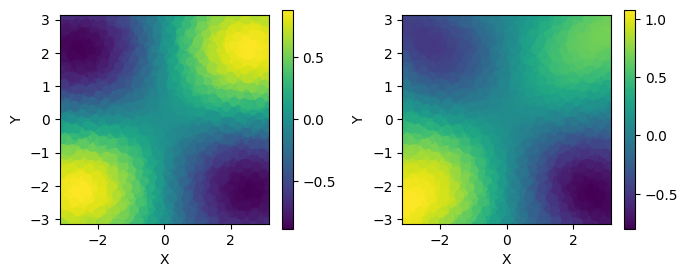

A: 1.0600509553624107 	B: 1.80363778828612 	C: 0.8063141203855428
Before pruning MSE Loss :  0.08634806
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%)

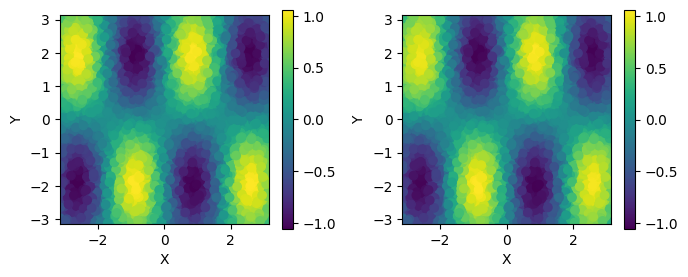

Pruning with threshold : 0.2301815003156662 for layer fc1
Pruning with threshold : 0.11578235775232315 for layer fc2
Pruning with threshold : 0.12212289869785309 for layer fc3
Pruning with threshold : 0.11069951951503754 for layer fc4
Pruning with threshold : 0.10762573778629303 for layer fc5
Pruning with threshold : 0.09697090834379196 for layer fc6
Pruning with threshold : 0.09087350219488144 for layer fc7
Pruning with threshold : 0.08827895671129227 for layer fc8
after pruning MSE Loss :  0.6361668
fc1.weight           | nonzeros =      29 /      40 ( 72.50%) | total_pruned =      11 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     249 /     400 ( 62.25%) | total_pruned =     151 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     226 /     400 ( 56.50%) | total_pruned

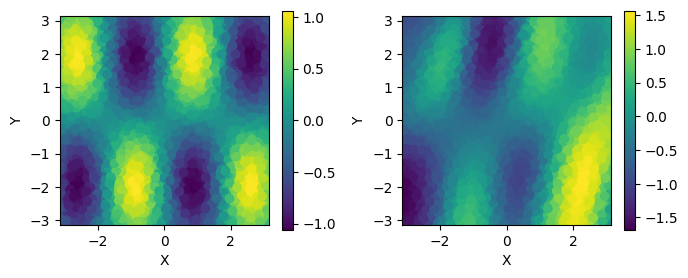

A: 0.7170707652711635 	B: 1.2481880765132585 	C: 1.5748870026040955
Before pruning MSE Loss :  0.1534799
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%

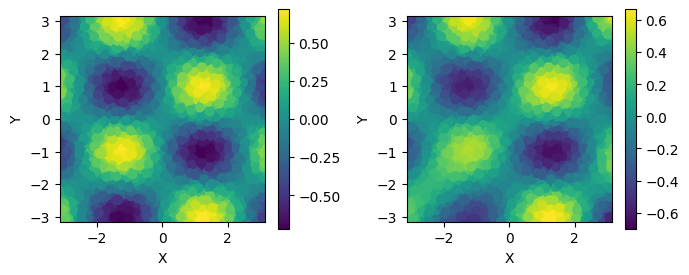

Pruning with threshold : 0.22410660982131958 for layer fc1
Pruning with threshold : 0.11637526005506516 for layer fc2
Pruning with threshold : 0.11048108339309692 for layer fc3
Pruning with threshold : 0.0924292802810669 for layer fc4
Pruning with threshold : 0.08734375238418579 for layer fc5
Pruning with threshold : 0.08841343969106674 for layer fc6
Pruning with threshold : 0.08367491513490677 for layer fc7
Pruning with threshold : 0.06599109619855881 for layer fc8
after pruning MSE Loss :  0.73516184
fc1.weight           | nonzeros =      28 /      40 ( 70.00%) | total_pruned =      12 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     249 /     400 ( 62.25%) | total_pruned =     151 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     231 /     400 ( 57.75%) | total_prune

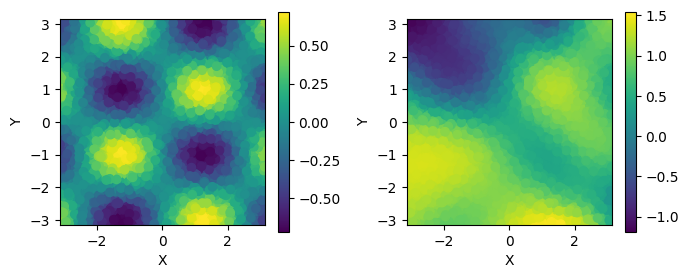

A: 1.3027367182262846 	B: 0.5521091050706922 	C: 1.4942715403090903
Before pruning MSE Loss :  0.06235797
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

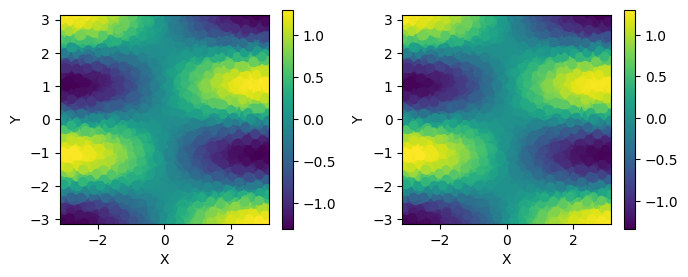

Pruning with threshold : 0.20196422934532166 for layer fc1
Pruning with threshold : 0.11235520243644714 for layer fc2
Pruning with threshold : 0.13706685602664948 for layer fc3
Pruning with threshold : 0.10163641721010208 for layer fc4
Pruning with threshold : 0.1144225001335144 for layer fc5
Pruning with threshold : 0.10318522155284882 for layer fc6
Pruning with threshold : 0.08704977482557297 for layer fc7
Pruning with threshold : 0.10685790330171585 for layer fc8
after pruning MSE Loss :  0.4776247
fc1.weight           | nonzeros =      30 /      40 ( 75.00%) | total_pruned =      10 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     267 /     400 ( 66.75%) | total_pruned =     133 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     222 /     400 ( 55.50%) | total_pruned

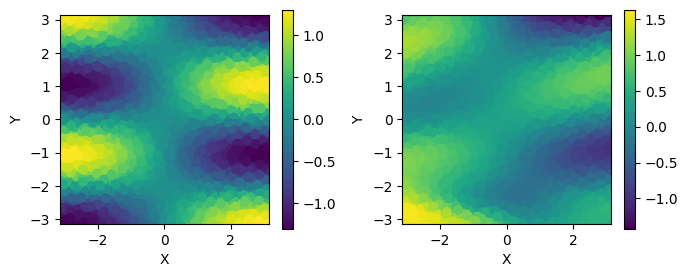

A: 1.4414725726351811 	B: 0.9122516777264776 	C: 1.405664910808274
Before pruning MSE Loss :  0.094763115
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

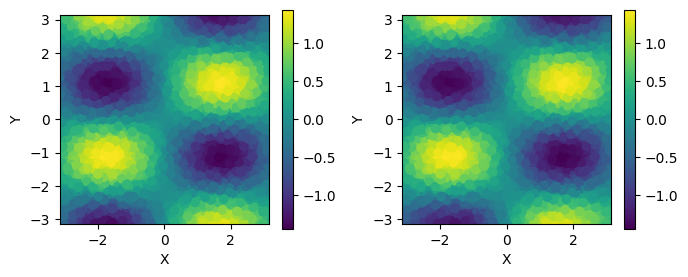

Pruning with threshold : 0.21004873514175415 for layer fc1
Pruning with threshold : 0.12120313197374344 for layer fc2
Pruning with threshold : 0.13127727806568146 for layer fc3
Pruning with threshold : 0.10694010555744171 for layer fc4
Pruning with threshold : 0.10992658883333206 for layer fc5
Pruning with threshold : 0.10416018962860107 for layer fc6
Pruning with threshold : 0.09349490702152252 for layer fc7
Pruning with threshold : 0.09325253963470459 for layer fc8
after pruning MSE Loss :  0.69555956
fc1.weight           | nonzeros =      29 /      40 ( 72.50%) | total_pruned =      11 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     263 /     400 ( 65.75%) | total_pruned =     137 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     249 /     400 ( 62.25%) | total_prun

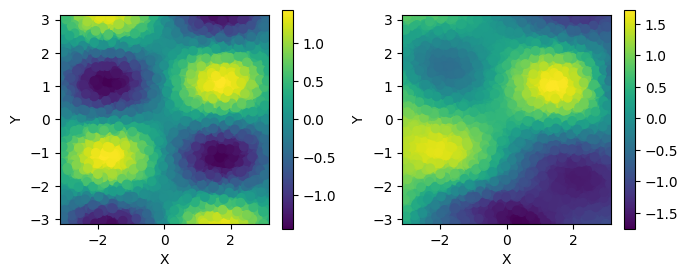

In [9]:
before_05 = []
after_05 = []

for model in models:
    ABC = model.split("_")[1:4]
    A = torch.tensor(float(ABC[0]), dtype=torch.float)
    B = torch.tensor(float(ABC[1]), dtype=torch.float)
    C = torch.tensor(float(ABC[2]), dtype=torch.float)
    print("A:",ABC[0],"\tB:",ABC[1],"\tC:",ABC[2])
    task = f"./data/train_{ABC[0]}_{ABC[1]}_{ABC[2]}_.npy"
    # 데이터를 준비합니다.
    with open(task, 'rb') as f:
        data = np.load(f,allow_pickle=True)
    x = data.T[0]
    y = data.T[1]
    f_true = A*np.sin(B*x) * np.sin(C*y)
    X = np.stack([x.ravel(), y.ravel()], axis=-1)
    X = torch.tensor(X, dtype=torch.float).to(device)
    f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)

    A = A.to(device)
    B = B.to(device)
    C = C.to(device)
    # 데이터 로더를 생성합니다.
    loader = create_dataloader(X, f_true, batch_size, shuffle)


    net = NN(mask=True)
    net.load_state_dict(torch.load(f"./data/model_{ABC[0]}_{ABC[1]}_{ABC[2]}_.pt"))
    net = net.to(device)

    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## before pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    before_05.append(loss)
    print("Before pruning MSE Loss : ", loss)
    print_nonzeros(net)
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()
    
    
    ################################## pruning start #####################################
    net.prune_by_std(0.5)
    
    ################################## pruning end #####################################
    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## after pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    after_05.append(loss)
    print("after pruning MSE Loss : ", loss)
    print_nonzeros(net)
    
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()

# std threshold = 0.25

A: 0.6461435586370163 	B: 0.7519880200471808 	C: 1.3459413475493847
Before pruning MSE Loss :  0.051921863
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

/tmp/ipykernel_3573/1381262230.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)


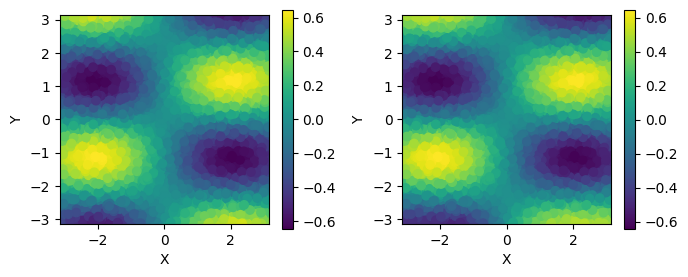

Pruning with threshold : 0.10087987780570984 for layer fc1
Pruning with threshold : 0.061260949820280075 for layer fc2
Pruning with threshold : 0.06045396625995636 for layer fc3
Pruning with threshold : 0.04724802449345589 for layer fc4
Pruning with threshold : 0.04628276452422142 for layer fc5
Pruning with threshold : 0.0453634187579155 for layer fc6
Pruning with threshold : 0.03784145414829254 for layer fc7
Pruning with threshold : 0.029373498633503914 for layer fc8
after pruning MSE Loss :  0.1316928
fc1.weight           | nonzeros =      34 /      40 ( 85.00%) | total_pruned =       6 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     338 /     400 ( 84.50%) | total_pruned =      62 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     321 /     400 ( 80.25%) | total_prun

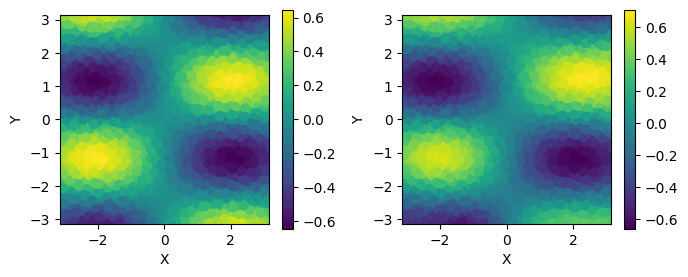

A: 0.9926610113369381 	B: 1.0044676920990128 	C: 1.0638761184602317
Before pruning MSE Loss :  0.04581528
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

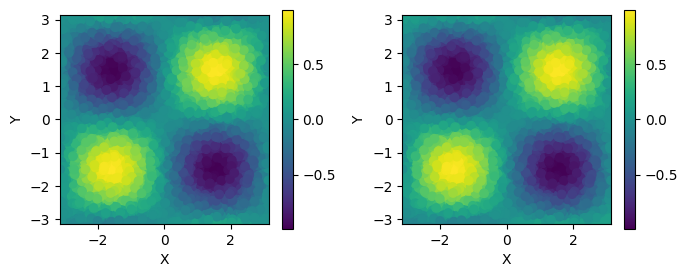

Pruning with threshold : 0.10977758467197418 for layer fc1
Pruning with threshold : 0.0628357082605362 for layer fc2
Pruning with threshold : 0.06491733342409134 for layer fc3
Pruning with threshold : 0.05454867333173752 for layer fc4
Pruning with threshold : 0.05402997136116028 for layer fc5
Pruning with threshold : 0.04651151970028877 for layer fc6
Pruning with threshold : 0.04414135590195656 for layer fc7
Pruning with threshold : 0.041534047573804855 for layer fc8
after pruning MSE Loss :  0.26215795
fc1.weight           | nonzeros =      35 /      40 ( 87.50%) | total_pruned =       5 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     322 /     400 ( 80.50%) | total_pruned =      78 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     312 /     400 ( 78.00%) | total_prun

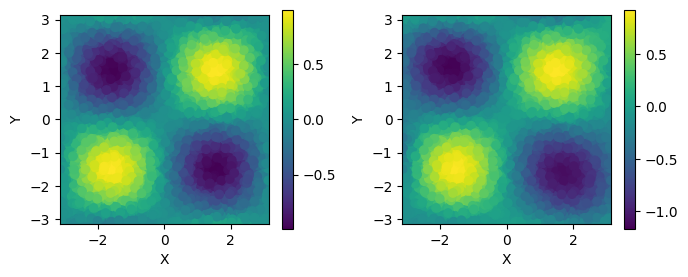

A: 0.8056793994939285 	B: 1.667088624340879 	C: 0.6558453062090482
Before pruning MSE Loss :  0.065595016
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

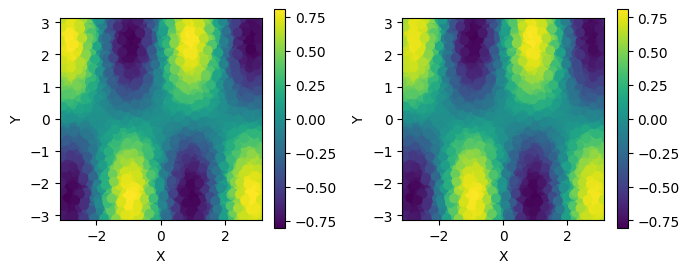

Pruning with threshold : 0.12140247970819473 for layer fc1
Pruning with threshold : 0.06350908428430557 for layer fc2
Pruning with threshold : 0.05934455990791321 for layer fc3
Pruning with threshold : 0.05334429815411568 for layer fc4
Pruning with threshold : 0.05087030678987503 for layer fc5
Pruning with threshold : 0.04644791781902313 for layer fc6
Pruning with threshold : 0.04499579221010208 for layer fc7
Pruning with threshold : 0.03870709612965584 for layer fc8
after pruning MSE Loss :  0.25351083
fc1.weight           | nonzeros =      33 /      40 ( 82.50%) | total_pruned =       7 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     326 /     400 ( 81.50%) | total_pruned =      74 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     312 /     400 ( 78.00%) | total_prun

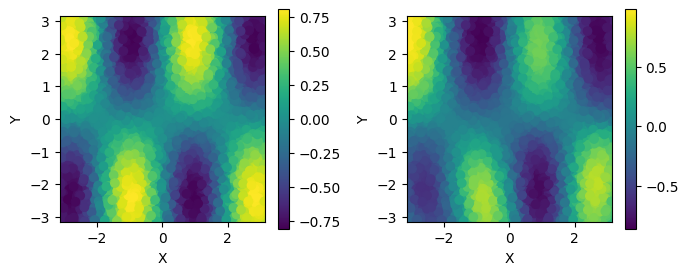

A: 1.0113005341300303 	B: 1.1042978763708164 	C: 0.9825942665038673
Before pruning MSE Loss :  0.051190443
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

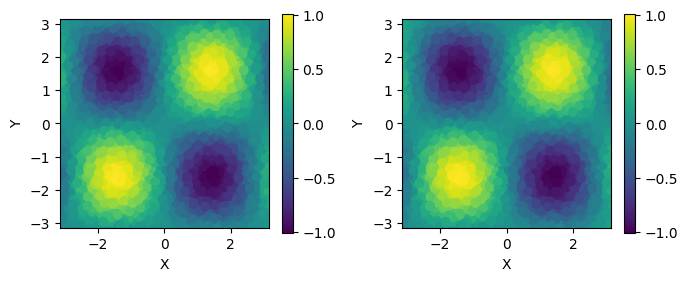

Pruning with threshold : 0.11094498634338379 for layer fc1
Pruning with threshold : 0.06114005297422409 for layer fc2
Pruning with threshold : 0.06325153261423111 for layer fc3
Pruning with threshold : 0.054100558161735535 for layer fc4
Pruning with threshold : 0.052079182118177414 for layer fc5
Pruning with threshold : 0.046184979379177094 for layer fc6
Pruning with threshold : 0.042381878942251205 for layer fc7
Pruning with threshold : 0.038850825279951096 for layer fc8
after pruning MSE Loss :  0.25464344
fc1.weight           | nonzeros =      33 /      40 ( 82.50%) | total_pruned =       7 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     342 /     400 ( 85.50%) | total_pruned =      58 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     306 /     400 ( 76.50%) | total

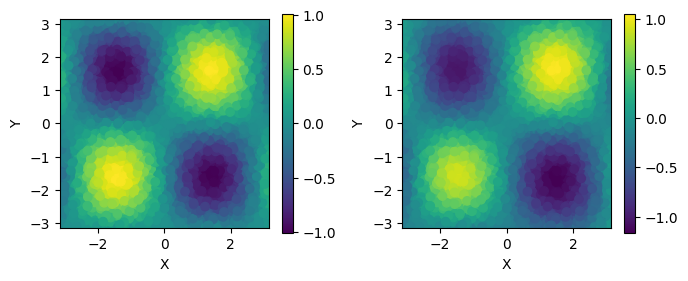

A: 1.3793156162463651 	B: 1.4235602716612665 	C: 0.5256465964473
Before pruning MSE Loss :  0.07946929
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%) 

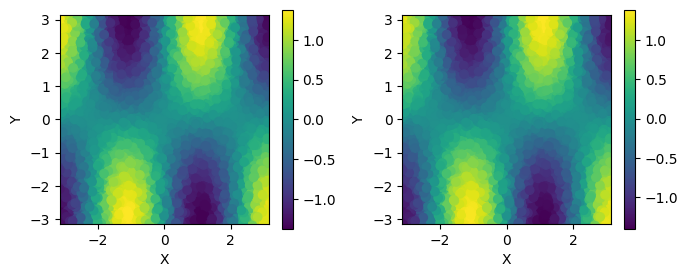

Pruning with threshold : 0.10139138996601105 for layer fc1
Pruning with threshold : 0.06364428251981735 for layer fc2
Pruning with threshold : 0.061323173344135284 for layer fc3
Pruning with threshold : 0.05392652750015259 for layer fc4
Pruning with threshold : 0.05080803856253624 for layer fc5
Pruning with threshold : 0.04635952040553093 for layer fc6
Pruning with threshold : 0.04170655831694603 for layer fc7
Pruning with threshold : 0.04563169553875923 for layer fc8
after pruning MSE Loss :  0.37911665
fc1.weight           | nonzeros =      35 /      40 ( 87.50%) | total_pruned =       5 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     316 /     400 ( 79.00%) | total_pruned =      84 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     327 /     400 ( 81.75%) | total_pru

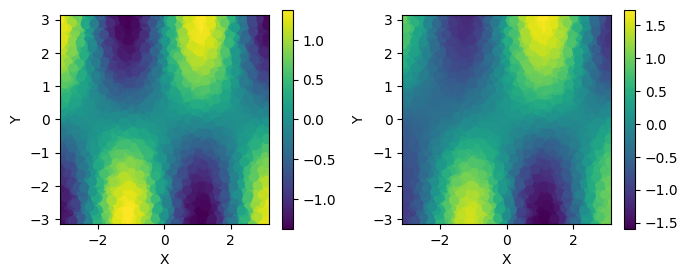

A: 1.1550933504346717 	B: 1.3479038854802354 	C: 1.2269056767996454
Before pruning MSE Loss :  0.09262624
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

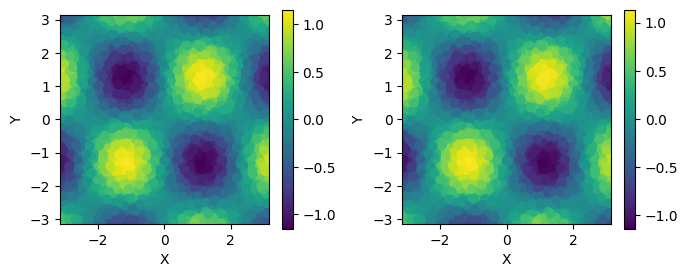

Pruning with threshold : 0.10616176575422287 for layer fc1
Pruning with threshold : 0.0618266724050045 for layer fc2
Pruning with threshold : 0.0639471486210823 for layer fc3
Pruning with threshold : 0.05544688180088997 for layer fc4
Pruning with threshold : 0.045641567558050156 for layer fc5
Pruning with threshold : 0.0476951040327549 for layer fc6
Pruning with threshold : 0.04345462843775749 for layer fc7
Pruning with threshold : 0.04051937907934189 for layer fc8
after pruning MSE Loss :  0.40294713
fc1.weight           | nonzeros =      36 /      40 ( 90.00%) | total_pruned =       4 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     334 /     400 ( 83.50%) | total_pruned =      66 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     329 /     400 ( 82.25%) | total_pruned

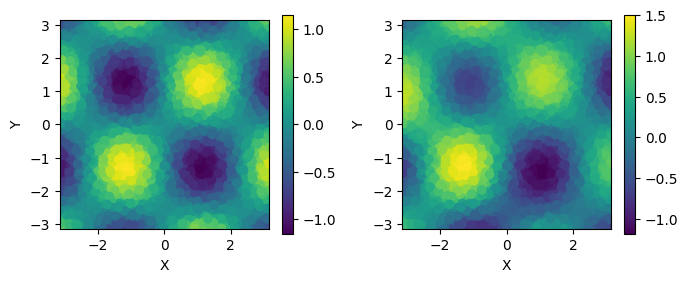

A: 0.6964663563181073 	B: 0.8714126073073516 	C: 0.8858933764210435
Before pruning MSE Loss :  0.029162524
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

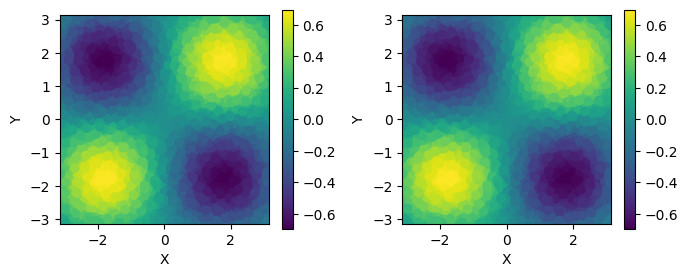

Pruning with threshold : 0.10407193005084991 for layer fc1
Pruning with threshold : 0.055931173264980316 for layer fc2
Pruning with threshold : 0.0516493134200573 for layer fc3
Pruning with threshold : 0.05171108990907669 for layer fc4
Pruning with threshold : 0.048614732921123505 for layer fc5
Pruning with threshold : 0.04445555433630943 for layer fc6
Pruning with threshold : 0.039193227887153625 for layer fc7
Pruning with threshold : 0.029698679223656654 for layer fc8
after pruning MSE Loss :  0.20199516
fc1.weight           | nonzeros =      33 /      40 ( 82.50%) | total_pruned =       7 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     337 /     400 ( 84.25%) | total_pruned =      63 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     328 /     400 ( 82.00%) | total_p

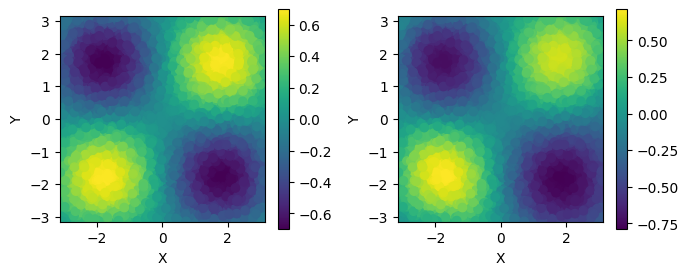

A: 0.7807992483360096 	B: 1.2503325654877329 	C: 0.6434790402413546
Before pruning MSE Loss :  0.030495431
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.0

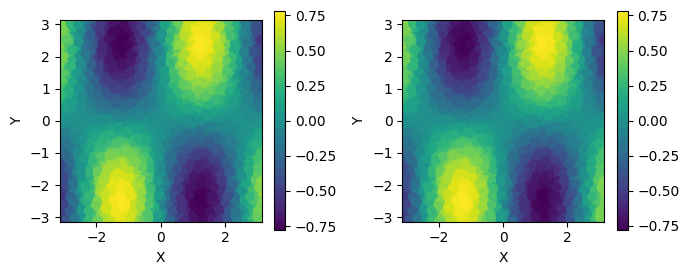

Pruning with threshold : 0.10500676184892654 for layer fc1
Pruning with threshold : 0.06064971163868904 for layer fc2
Pruning with threshold : 0.058735184371471405 for layer fc3
Pruning with threshold : 0.05019479990005493 for layer fc4
Pruning with threshold : 0.049632877111434937 for layer fc5
Pruning with threshold : 0.04344244301319122 for layer fc6
Pruning with threshold : 0.03874064236879349 for layer fc7
Pruning with threshold : 0.028280207887291908 for layer fc8
after pruning MSE Loss :  0.22949846
fc1.weight           | nonzeros =      32 /      40 ( 80.00%) | total_pruned =       8 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     323 /     400 ( 80.75%) | total_pruned =      77 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     313 /     400 ( 78.25%) | total_p

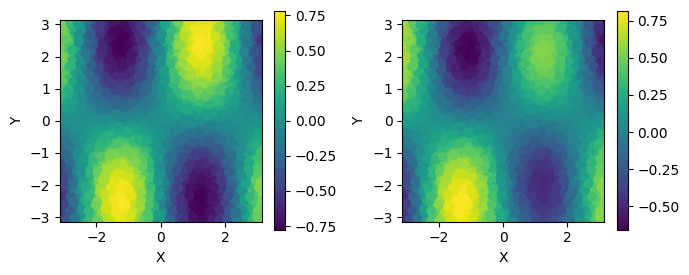

A: 1.2516291665726755 	B: 0.6855972644708601 	C: 1.1553484825375557
Before pruning MSE Loss :  0.05462811
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

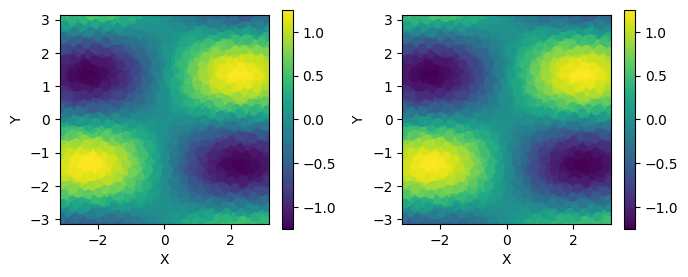

Pruning with threshold : 0.1048794612288475 for layer fc1
Pruning with threshold : 0.05128997191786766 for layer fc2
Pruning with threshold : 0.050653476268053055 for layer fc3
Pruning with threshold : 0.045634038746356964 for layer fc4
Pruning with threshold : 0.04698016494512558 for layer fc5
Pruning with threshold : 0.04344651475548744 for layer fc6
Pruning with threshold : 0.043038442730903625 for layer fc7
Pruning with threshold : 0.04751809686422348 for layer fc8
after pruning MSE Loss :  0.25037763
fc1.weight           | nonzeros =      33 /      40 ( 82.50%) | total_pruned =       7 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     323 /     400 ( 80.75%) | total_pruned =      77 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     324 /     400 ( 81.00%) | total_pr

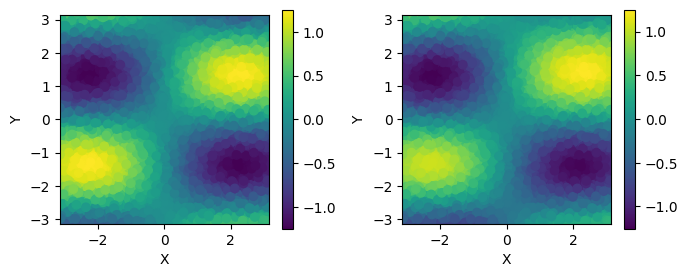

A: 1.215064271879887 	B: 1.033489549337249 	C: 1.319033954472093
Before pruning MSE Loss :  0.07172293
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%) 

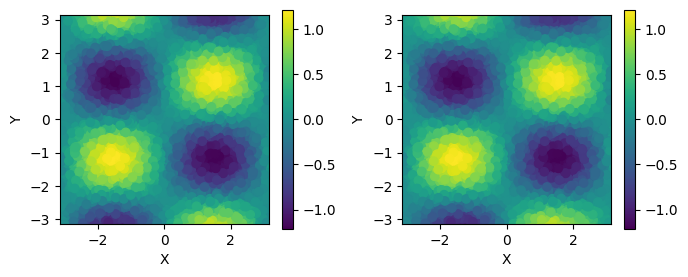

Pruning with threshold : 0.11021959781646729 for layer fc1
Pruning with threshold : 0.060740482062101364 for layer fc2
Pruning with threshold : 0.0647842064499855 for layer fc3
Pruning with threshold : 0.05312737077474594 for layer fc4
Pruning with threshold : 0.05951349437236786 for layer fc5
Pruning with threshold : 0.05302603915333748 for layer fc6
Pruning with threshold : 0.04701896011829376 for layer fc7
Pruning with threshold : 0.04992204159498215 for layer fc8
after pruning MSE Loss :  0.27269816
fc1.weight           | nonzeros =      38 /      40 ( 95.00%) | total_pruned =       2 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     326 /     400 ( 81.50%) | total_pruned =      74 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     320 /     400 ( 80.00%) | total_prun

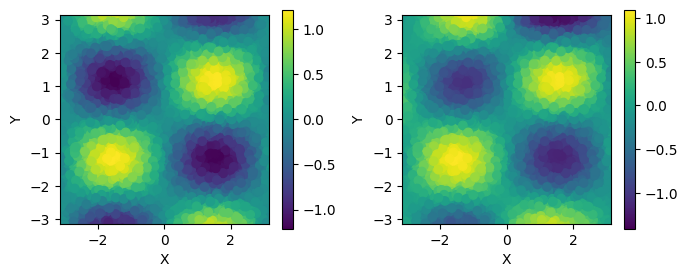

A: 0.882821876481688 	B: 0.6111822228604451 	C: 0.7286163354114135
Before pruning MSE Loss :  0.10829572
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%

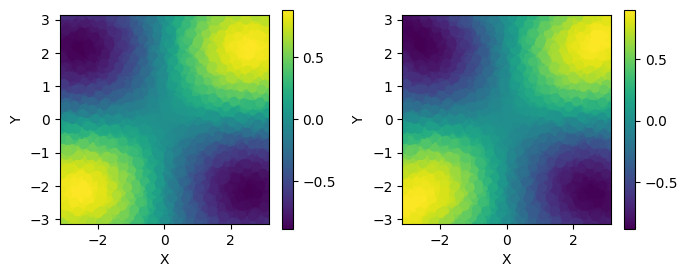

Pruning with threshold : 0.09977282583713531 for layer fc1
Pruning with threshold : 0.04717967286705971 for layer fc2
Pruning with threshold : 0.047250017523765564 for layer fc3
Pruning with threshold : 0.043056681752204895 for layer fc4
Pruning with threshold : 0.04017795994877815 for layer fc5
Pruning with threshold : 0.038527511060237885 for layer fc6
Pruning with threshold : 0.03767178952693939 for layer fc7
Pruning with threshold : 0.03481027111411095 for layer fc8
after pruning MSE Loss :  0.16136394
fc1.weight           | nonzeros =      34 /      40 ( 85.00%) | total_pruned =       6 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     338 /     400 ( 84.50%) | total_pruned =      62 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     328 /     400 ( 82.00%) | total_p

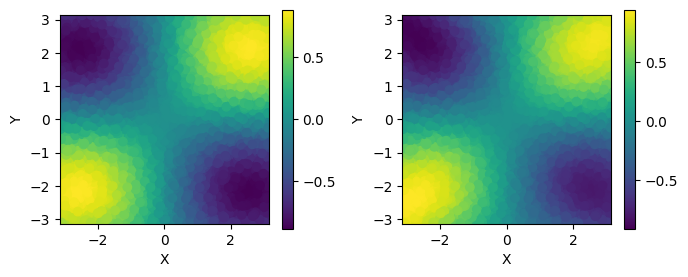

A: 1.0600509553624107 	B: 1.80363778828612 	C: 0.8063141203855428
Before pruning MSE Loss :  0.08634806
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%)

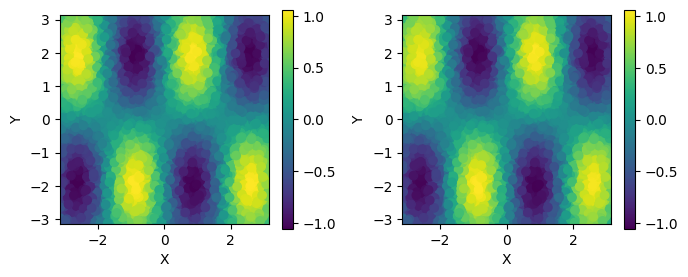

Pruning with threshold : 0.1150907501578331 for layer fc1
Pruning with threshold : 0.057891178876161575 for layer fc2
Pruning with threshold : 0.061061449348926544 for layer fc3
Pruning with threshold : 0.05534975975751877 for layer fc4
Pruning with threshold : 0.053812868893146515 for layer fc5
Pruning with threshold : 0.04848545417189598 for layer fc6
Pruning with threshold : 0.04543675109744072 for layer fc7
Pruning with threshold : 0.04413947835564613 for layer fc8
after pruning MSE Loss :  0.35793394
fc1.weight           | nonzeros =      34 /      40 ( 85.00%) | total_pruned =       6 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     326 /     400 ( 81.50%) | total_pruned =      74 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     307 /     400 ( 76.75%) | total_pr

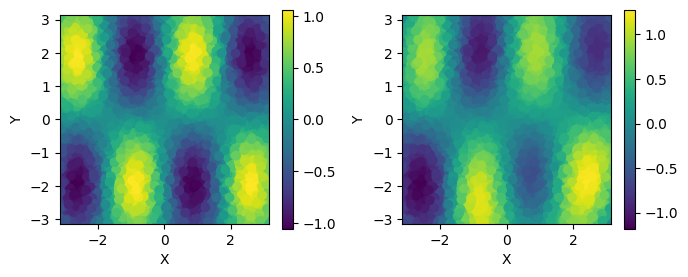

A: 0.7170707652711635 	B: 1.2481880765132585 	C: 1.5748870026040955
Before pruning MSE Loss :  0.1534799
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00%

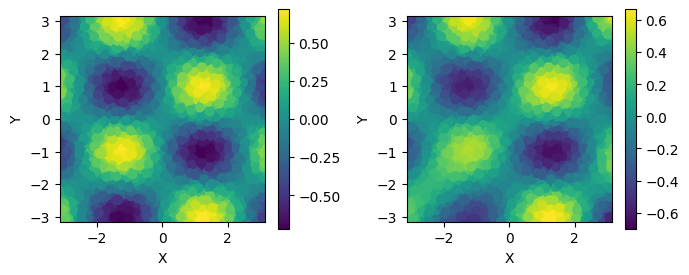

Pruning with threshold : 0.11205330491065979 for layer fc1
Pruning with threshold : 0.05818763002753258 for layer fc2
Pruning with threshold : 0.05524054169654846 for layer fc3
Pruning with threshold : 0.04621464014053345 for layer fc4
Pruning with threshold : 0.043671876192092896 for layer fc5
Pruning with threshold : 0.04420671984553337 for layer fc6
Pruning with threshold : 0.041837457567453384 for layer fc7
Pruning with threshold : 0.032995548099279404 for layer fc8
after pruning MSE Loss :  0.4018043
fc1.weight           | nonzeros =      36 /      40 ( 90.00%) | total_pruned =       4 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     324 /     400 ( 81.00%) | total_pruned =      76 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     319 /     400 ( 79.75%) | total_pr

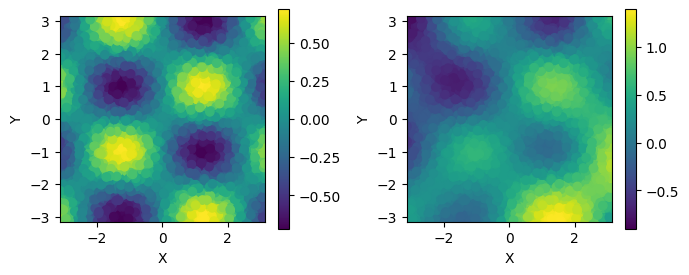

A: 1.3027367182262846 	B: 0.5521091050706922 	C: 1.4942715403090903
Before pruning MSE Loss :  0.06235797
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

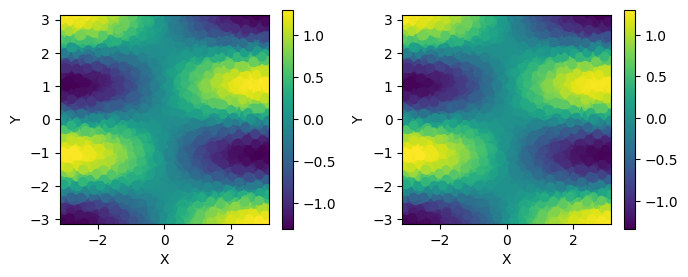

Pruning with threshold : 0.10098211467266083 for layer fc1
Pruning with threshold : 0.05617760121822357 for layer fc2
Pruning with threshold : 0.06853342801332474 for layer fc3
Pruning with threshold : 0.05081820860505104 for layer fc4
Pruning with threshold : 0.0572112500667572 for layer fc5
Pruning with threshold : 0.05159261077642441 for layer fc6
Pruning with threshold : 0.043524887412786484 for layer fc7
Pruning with threshold : 0.053428951650857925 for layer fc8
after pruning MSE Loss :  0.4192472
fc1.weight           | nonzeros =      35 /      40 ( 87.50%) | total_pruned =       5 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     327 /     400 ( 81.75%) | total_pruned =      73 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     319 /     400 ( 79.75%) | total_prun

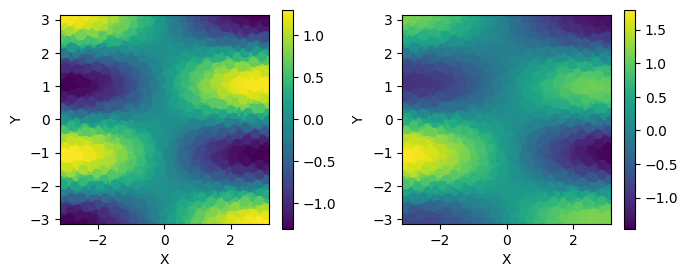

A: 1.4414725726351811 	B: 0.9122516777264776 	C: 1.405664910808274
Before pruning MSE Loss :  0.094763115
fc1.weight           | nonzeros =      40 /      40 (100.00%) | total_pruned =       0 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc3.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc4.weight           | nonzeros =     400 /     400 (100.00%) | total_pruned =       0 | shape = (20, 20)
fc4.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc5.weight           | nonzeros =     400 /     400 (100.00

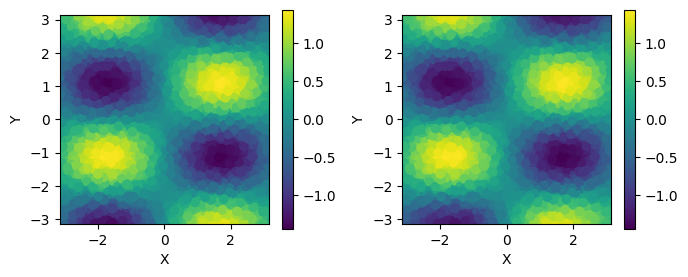

Pruning with threshold : 0.10502436757087708 for layer fc1
Pruning with threshold : 0.06060156598687172 for layer fc2
Pruning with threshold : 0.06563863903284073 for layer fc3
Pruning with threshold : 0.053470052778720856 for layer fc4
Pruning with threshold : 0.05496329441666603 for layer fc5
Pruning with threshold : 0.05208009481430054 for layer fc6
Pruning with threshold : 0.04674745351076126 for layer fc7
Pruning with threshold : 0.046626269817352295 for layer fc8
after pruning MSE Loss :  0.6197746
fc1.weight           | nonzeros =      35 /      40 ( 87.50%) | total_pruned =       5 | shape = (20, 2)
fc1.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc2.weight           | nonzeros =     334 /     400 ( 83.50%) | total_pruned =      66 | shape = (20, 20)
fc2.bias             | nonzeros =      20 /      20 (100.00%) | total_pruned =       0 | shape = (20,)
fc3.weight           | nonzeros =     324 /     400 ( 81.00%) | total_pru

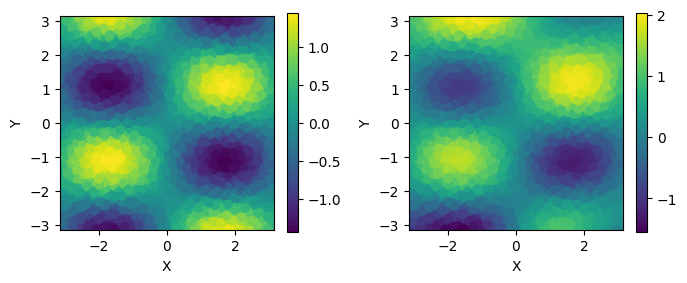

In [10]:
before_025 = []
after_025 = []

for model in models:
    ABC = model.split("_")[1:4]
    A = torch.tensor(float(ABC[0]), dtype=torch.float)
    B = torch.tensor(float(ABC[1]), dtype=torch.float)
    C = torch.tensor(float(ABC[2]), dtype=torch.float)
    print("A:",ABC[0],"\tB:",ABC[1],"\tC:",ABC[2])
    task = f"./data/train_{ABC[0]}_{ABC[1]}_{ABC[2]}_.npy"
    # 데이터를 준비합니다.
    with open(task, 'rb') as f:
        data = np.load(f,allow_pickle=True)
    x = data.T[0]
    y = data.T[1]
    f_true = A*np.sin(B*x) * np.sin(C*y)
    X = np.stack([x.ravel(), y.ravel()], axis=-1)
    X = torch.tensor(X, dtype=torch.float).to(device)
    f_true = torch.tensor(f_true.ravel(), dtype=torch.float).view(-1, 1)

    A = A.to(device)
    B = B.to(device)
    C = C.to(device)
    # 데이터 로더를 생성합니다.
    loader = create_dataloader(X, f_true, batch_size, shuffle)


    net = NN(mask=True)
    net.load_state_dict(torch.load(f"./data/model_{ABC[0]}_{ABC[1]}_{ABC[2]}_.pt"))
    net = net.to(device)

    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## before pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    before_025.append(loss)
    print("Before pruning MSE Loss : ", loss)
    print_nonzeros(net)
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()
    
    
    ################################## pruning start #####################################
    net.prune_by_std(0.25)
    
    ################################## pruning end #####################################
    with torch.no_grad():
        f_pred = net(X).cpu().numpy().squeeze()
    
    ################################## after pruning #####################################
    loss = np.mean(np.sqrt(np.abs(np.square(f_true.reshape(-1).numpy())-np.square(f_pred))))
    after_025.append(loss)
    print("after pruning MSE Loss : ", loss)
    print_nonzeros(net)
    
    fig, ax = plt.subplots(nrows=1,ncols=2, figsize=(7,3))
    # grid
    xi, yi = np.mgrid[x.min():x.max():400j, y.min():y.max():400j]

    # f_true figure
    rbf = scipy.interpolate.Rbf(x, y, f_true)
    org = rbf(xi, yi)
    img = ax[0].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[0].scatter(x, y, c=f_true)
    ax[0].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)

    # f_pred figure
    rbf = scipy.interpolate.Rbf(x, y, f_pred)
    org = rbf(xi, yi)
    img = ax[1].imshow(org.T, origin='lower',extent=[x.min(), x.max(), y.min(), y.max()])
    ax[1].scatter(x, y, c=f_pred)
    ax[1].set(xlabel='X', ylabel='Y')
    fig.colorbar(img,shrink=0.9)
    plt.tight_layout()
    plt.show()